# ENVI Tutorial:

### What is COVET?

COVET is a method for representing and quantifying cellular niches based on their gene-gene covariance. COVET takes as input spatial data and returns the niche gene-gene covariance matrix of each cell.


### What is ENVI?
ENVI integrates between paired scRNA-seq and spatial data. ENVI relies on COVET and predicts spatial context of dissociated scRNA-seq data & imputes missing genes for the spatial data. ENVI takes as input spatial data and scRNA_seq data, trains a VAE model and produces latent embeddings for each dataset, imputed values for the spatial data, and predicted COVET matrices for the scRNA-seq data.


***
# Setting Up
ENVI is based on tenosrflow and scanpy. This tutorial installs the ENVI package (which includes COVET), and the following dependencies:
- sklearn
- scipy
- scanpy
- phenograph
- tensorflow (Apple Silicon Mac users need to manually install their specific tensorflow, https://developer.apple.com/metal/tensorflow-plugin/)
- tensorflow_probability

For this tutorial to run, the following packages are also required and need to be pre-installed:
- harmonyTS (https://github.com/dpeerlab/Harmony)
- colorcet (very useful for plotting)


In [1]:
import os

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   
os.environ["CUDA_VISIBLE_DEVICES"]="0" # Change to -1 if you want to use CPU!

import warnings
warnings.filterwarnings('ignore')


# Install ENVI

ENVI can be installed directly with pip with the following command:

In [2]:
!pip install scenvi

# Importing

In [3]:
import scenvi

2024-03-09 17:07:01.018129: W external/xla/xla/service/gpu/nvptx_compiler.cc:698] The NVIDIA driver's CUDA version is 11.7 which is older than the ptxas CUDA version (11.8.89). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.
2024-03-09 17:07:02.240035: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-09 17:07:02.240084: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-09 17:07:02.241488: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS 

In [4]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import pandas as pd
import scanpy as sc
import colorcet
import umap.umap_ as umap
from fa2 import ForceAtlas2

# Utility Functions:

Some functions that are used in the analysis in this tutorial, feel free to switch to you own prefered versions

In [6]:
def flatten(arr):
    return(np.reshape(arr, [arr.shape[0], -1]))

def force_directed_layout(affinity_matrix, cell_names=None, verbose=True, iterations=500, device='cpu'):
    """" Function to compute force directed layout from the affinity_matrix
    :param affinity_matrix: Sparse matrix representing affinities between cells
    :param cell_names: pandas Series object with cell names
    :param verbose: Verbosity for force directed layout computation
    :param iterations: Number of iterations used by ForceAtlas 
    :return: Pandas data frame representing the force directed layout
    """

    init_coords = np.random.random((affinity_matrix.shape[0], 2))
    
    if device == 'cpu':
        forceatlas2 = ForceAtlas2(
            # Behavior alternatives
            outboundAttractionDistribution=False,  
            linLogMode=False,  
            adjustSizes=False,  
            edgeWeightInfluence=1.0,
            # Performance
            jitterTolerance=1.0,  
            barnesHutOptimize=True,
            barnesHutTheta=1.2,
            multiThreaded=False,  
            # Tuning
            scalingRatio=2.0,
            strongGravityMode=False,
            gravity=1.0,
            # Log
            verbose=verbose)

        positions = forceatlas2.forceatlas2(
            affinity_matrix, pos=init_coords, iterations=iterations)
        positions = np.array(positions)
        
        
    positions = pd.DataFrame(positions,
                             index=np.arange(affinity_matrix.shape[0]), columns=['x', 'y'])
    return positions

def run_diffusion_maps(data_df, n_components=10, knn=30, alpha=0):
    """Run Diffusion maps using the adaptive anisotropic kernel
    :param data_df: PCA projections of the data or adjacency matrix
    :param n_components: Number of diffusion components
    :param knn: Number of nearest neighbors for graph construction
    :param alpha: Normalization parameter for the diffusion operator
    :return: Diffusion components, corresponding eigen values and the diffusion operator
    """
    
    # Determine the kernel
    N = data_df.shape[0]

    if(type(data_df).__module__ == np.__name__):
        data_df = pd.DataFrame(data_df)
    
    if not scipy.sparse.issparse(data_df):
        print("Determing nearest neighbor graph...")
        temp = sc.AnnData(data_df.values)
        sc.pp.neighbors(temp, n_pcs=0, n_neighbors=knn)
        kNN = temp.obsp['distances']

        # Adaptive k
        adaptive_k = int(np.floor(knn / 3))
        adaptive_std = np.zeros(N)

        for i in np.arange(len(adaptive_std)):
            adaptive_std[i] = np.sort(kNN.data[kNN.indptr[i] : kNN.indptr[i + 1]])[
                adaptive_k - 1
            ]

        # Kernel
        x, y, dists = scipy.sparse.find(kNN)

        # X, y specific stds
        dists = dists / adaptive_std[x]
        W = scipy.sparse.csr_matrix((np.exp(-dists), (x, y)), shape=[N, N])

        # Diffusion components
        kernel = W + W.T
    else:
        kernel = data_df

    # Markov
    D = np.ravel(kernel.sum(axis=1))

    if alpha > 0:
        # L_alpha
        D[D != 0] = D[D != 0] ** (-alpha)
        mat = scipy.sparse.csr_matrix((D, (range(N), range(N))), shape=[N, N])
        kernel = mat.dot(kernel).dot(mat)
        D = np.ravel(kernel.sum(axis=1))

    D[D != 0] = 1 / D[D != 0]
    T = scipy.sparse.csr_matrix((D, (range(N), range(N))), shape=[N, N]).dot(kernel)
    # Eigen value dcomposition
    D, V = scipy.sparse.linalg.eigs(T, n_components, tol=1e-4, maxiter=1000)
    D = np.real(D)
    V = np.real(V)
    inds = np.argsort(D)[::-1]
    D = D[inds]
    V = V[:, inds]

    # Normalize
    for i in range(V.shape[1]):
        V[:, i] = V[:, i] / np.linalg.norm(V[:, i])

    # Create are results dictionary
    res = {"T": T, "EigenVectors": V, "EigenValues": D}
    res["EigenVectors"] = pd.DataFrame(res["EigenVectors"])
    if not scipy.sparse.issparse(data_df):
        res["EigenVectors"].index = data_df.index
    res["EigenValues"] = pd.Series(res["EigenValues"])
    res["kernel"] = kernel

    return res


def FDL(data, k = 30):
    

    nbrs = sklearn.neighbors.NearestNeighbors(n_neighbors=int(k), metric='euclidean',
                               n_jobs=5).fit(data)
    kNN = nbrs.kneighbors_graph(data, mode='distance')
    # Adaptive k
    
    adaptive_k = int(np.floor(k / 3))
    nbrs = sklearn.neighbors.NearestNeighbors(n_neighbors=int(adaptive_k),
                           metric='euclidean', n_jobs=5).fit(data)
    adaptive_std = nbrs.kneighbors_graph(data, mode='distance').max(axis=1)
    adaptive_std = np.ravel(adaptive_std.todense())
    # Kernel
    x, y, dists = scipy.sparse.find(kNN)
    # X, y specific stds
    dists = dists / adaptive_std[x]
    N = data.shape[0]
    W = scipy.sparse.csr_matrix((np.exp(-dists), (x, y)), shape=[N, N])
    # Diffusion components
    kernel = W + W.T
    layout = force_directed_layout(kernel)
    return(layout)


# Data

Downloading Motor Cortex scRNA-seq and MERFISH data from the Pe'er lab aws and loading in with scanpy

In [7]:
!wget https://dp-lab-data-public.s3.amazonaws.com/ENVI/sc_data.h5ad
!wget https://dp-lab-data-public.s3.amazonaws.com/ENVI/st_data.h5ad

In [8]:
st_data = sc.read_h5ad('st_data.h5ad')
sc_data = sc.read_h5ad('sc_data.h5ad')

Defining cell type color palette

In [9]:
cat_cmap = matplotlib.cm.get_cmap('cet_glasbey')
combined_cell_types = np.union1d(list(set(st_data.obs['cell_type'])), list(set(sc_data.obs['cell_type'])))

cell_type_palette = {ctype:cat_cmap(i) for i,ctype in enumerate(combined_cell_types)}
cell_label_palette = {ctype:cat_cmap(i) for i,ctype in enumerate(list(set(st_data.obs['cell_label'])))}

cell_label_palette = {'GABAergic': (0.843137, 0.0, 0.0, 1.0),
 'Glutamatergic': (0.54902, 0.235294, 1.0, 1.0),
 'Non-Neuronal': (0.007843, 0.533333, 0.0, 1.0)}

/tmp/ipykernel_70816/1512740114.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cat_cmap = matplotlib.cm.get_cmap('cet_glasbey')


## Plotting the Motor Cortex MERFISH 

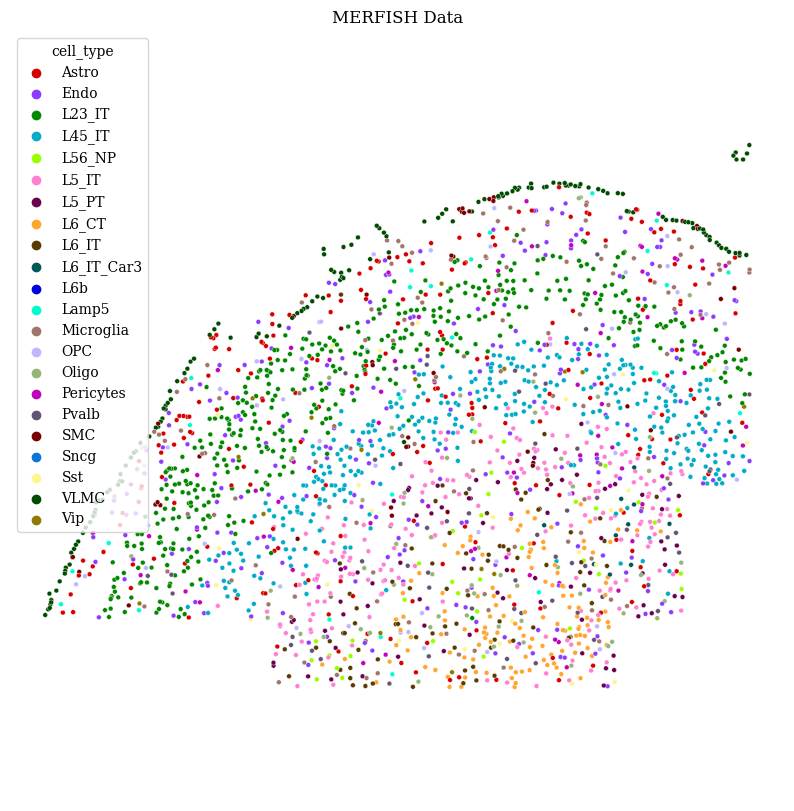

In [10]:
plt.figure(figsize=(10,10))

sns.scatterplot(x = st_data.obsm['spatial'][st_data.obs['batch'] == 'mouse1_slice10'][:, 1], 
                y = -st_data.obsm['spatial'][st_data.obs['batch'] == 'mouse1_slice10'][:, 0], legend = True,
                hue = st_data.obs['cell_type'][st_data.obs['batch'] == 'mouse1_slice10'], 
                s = 12, hue_order = combined_cell_types ,palette = cell_type_palette)
plt.axis('equal')
plt.axis('off')
plt.title("MERFISH Data")
plt.show()

## Plotting the Motor Cortex scRNAseq

In [12]:
fit = umap.UMAP(
    n_neighbors = 100,
    min_dist = 0.8,
    n_components = 2,
)

sc_data.layers['log'] = np.log(sc_data.X + 1)
sc.pp.highly_variable_genes(sc_data, layer = 'log', n_top_genes = 2048)
sc_data.obsm['UMAP_exp'] = fit.fit_transform(np.log(sc_data[:, sc_data.var['highly_variable']].X + 1))

/home/havivd/.local/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


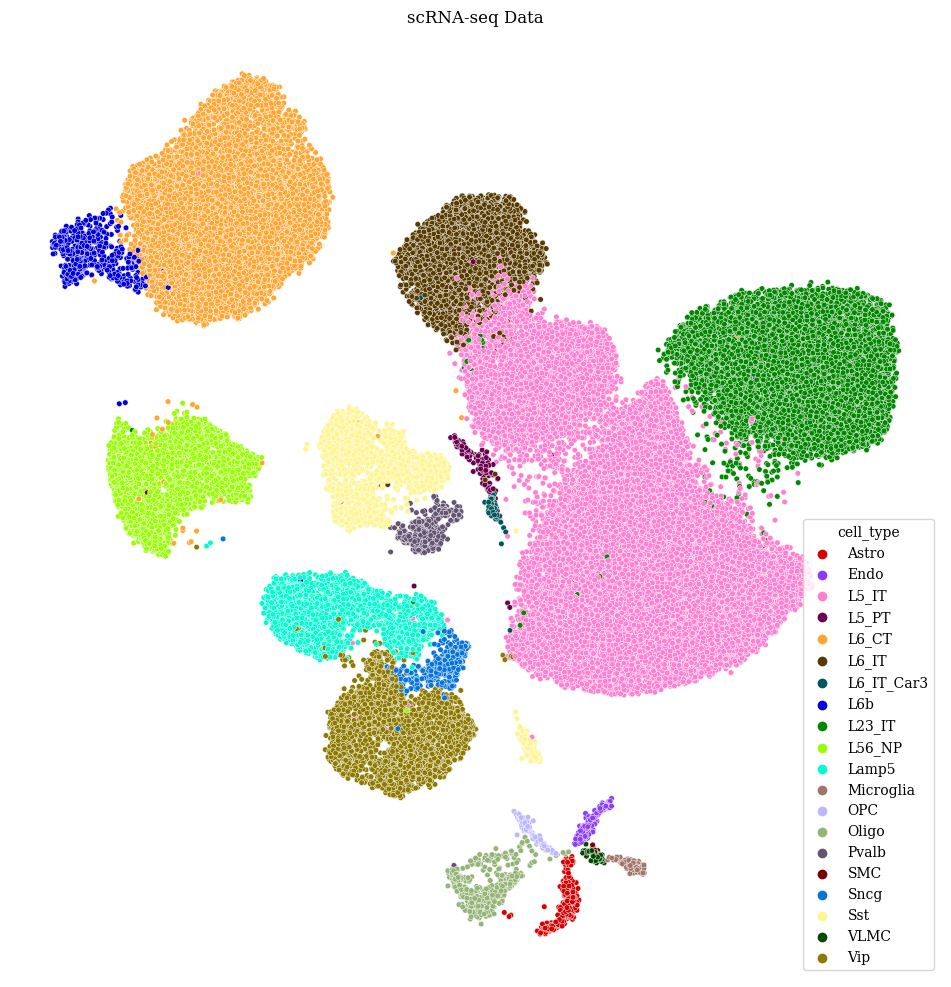

In [13]:
fig = plt.figure(figsize = (10,10))
sns.scatterplot(x = sc_data.obsm['UMAP_exp'][:, 0], y = sc_data.obsm['UMAP_exp'][:, 1],  hue = sc_data.obs['cell_type'], s = 16,
                palette = cell_type_palette, legend = True)
plt.tight_layout()
plt.axis('off')
plt.title('scRNA-seq Data')
plt.show()

# Running ENVI

We first define and ENVI model which computes the COVET matrices of the spatial data and intializes the CVAE:

In [30]:
envi_model = scenvi.ENVI(spatial_data = st_data, sc_data = sc_data)

Computing Niche Covariance Matrices
Initializing VAE
Finished Initializing ENVI


Training ENVI and run auxiliary function

In [31]:
envi_model.train()
envi_model.impute_genes()
envi_model.infer_niche()

 spatial: -6.560e-01 sc: -1.326e+00 cov: -5.447e-03 kl: 6.635e-01: 100%|██████████| 16000/16000 [03:02<00:00, 87.49it/s] 


Finished imputing missing gene for spatial data! See 'imputation' in obsm of ENVI.spatial_data


Read ENVI predictions

In [32]:
st_data.obsm['envi_latent'] = envi_model.spatial_data.obsm['envi_latent']
st_data.obsm['COVET'] = envi_model.spatial_data.obsm['COVET']
st_data.obsm['COVET_SQRT'] = envi_model.spatial_data.obsm['COVET_SQRT']
st_data.uns['COVET_genes'] =  envi_model.CovGenes
st_data.obsm['imputation'] = envi_model.spatial_data.obsm['imputation']

sc_data.obsm['envi_latent'] = envi_model.sc_data.obsm['envi_latent']
sc_data.obsm['COVET'] = envi_model.sc_data.obsm['COVET']
sc_data.obsm['COVET_SQRT'] = envi_model.sc_data.obsm['COVET_SQRT']
sc_data.uns['COVET_genes'] =  envi_model.CovGenes

## Plot UMAPs of ENVI latent

Double Checking that cell types co-embed from the MERFISH and scRNA-seq datasets

In [33]:
fit = umap.UMAP(
    n_neighbors = 100,
    min_dist = 0.3,
    n_components = 2,
)

latent_umap = fit.fit_transform(np.concatenate([st_data.obsm['envi_latent'], sc_data.obsm['envi_latent']], axis = 0))

st_data.obsm['latent_umap'] = latent_umap[:st_data.shape[0]]
sc_data.obsm['latent_umap'] = latent_umap[st_data.shape[0]:]          

In [34]:

lim_arr = np.concatenate([st_data.obsm['latent_umap'], sc_data.obsm['latent_umap']], axis = 0)


delta = 1
pre = 0.1
xmin = np.percentile(lim_arr[:, 0], pre) - delta 
xmax = np.percentile(lim_arr[:, 0], 100 - pre) + delta
ymin = np.percentile(lim_arr[:, 1], pre) - delta 
ymax = np.percentile(lim_arr[:, 1], 100 - pre) + delta


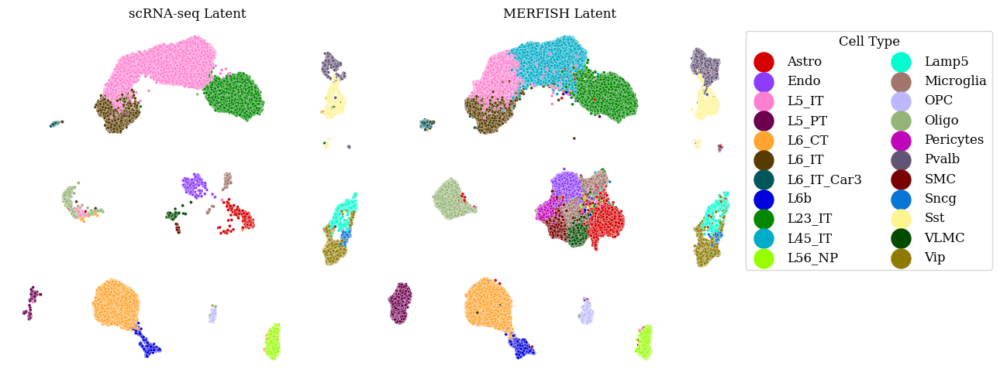

In [35]:
fig = plt.figure(figsize = (13,5))
plt.subplot(121)
sns.scatterplot(x = sc_data.obsm['latent_umap'][:, 0], 
                y = sc_data.obsm['latent_umap'][:, 1], hue = sc_data.obs['cell_type'], s = 8, palette = cell_type_palette, 
                legend = False)


# export_legend(legend, '/fscratch/havivd/ENVI_Figures/CortexMerFISH/cell_type_legned.svg')
plt.title("scRNA-seq Latent")
plt.xlim([xmin, xmax])
plt.ylim([ymin, ymax])
plt.axis('off')

plt.subplot(122)
sns.scatterplot(x = st_data.obsm['latent_umap'][:, 0], 
                y = st_data.obsm['latent_umap'][:, 1],  hue = st_data.obs['cell_type'], s = 8, palette = cell_type_palette, legend = True)


legend = plt.legend(title = 'Cell Type', prop={'size': 12}, fontsize = '12',  markerscale = 3, ncol = 2, bbox_to_anchor = (1, 1))#, loc = 'lower left')
plt.setp(legend.get_title(),fontsize='12')
plt.title("MERFISH Latent")

plt.axis('off')
plt.tight_layout()
plt.xlim([xmin, xmax])
plt.ylim([ymin, ymax])
plt.show()

# ENVI COVET analysis:

- Zooming on the Glutamatergic neuron, and using their COVET embedding for pseudo-depth prediction

In [36]:
st_data_sst = st_data[st_data.obs['cell_type'] == 'Sst']
sc_data_sst = sc_data[sc_data.obs['cell_type'] == 'Sst']

In [40]:
sst_palette = {'Th': (0.0, 0.294118, 0.0, 1.0),
               'Calb2': (0.560784, 0.478431, 0.0, 1.0),
               'Chodl': (1.0, 0.447059, 0.4, 1.0),
               'Myh8': (0.933333, 0.72549, 0.72549, 1.0),
               'Crhr2': (0.368627, 0.494118, 0.4, 1.0),
               'C1ql3': (0.607843, 0.894118, 1.0, 1.0),
               'Pvalb Etv1': (0.92549, 0.0, 0.466667, 1.0),
               'Hpse': (0.65098, 0.482353, 0.72549, 1.0),
               'Hspe': (0.352941, 0.0, 0.643137, 1.0),
               'Crh': (0.607843, 0.894118, 1.0, 1.0),
               'Etv1': (0.92549, 0.0, 0.466667, 1.0)}

### Calculating FDL and DC on COVET

- Note that we are running FDL on COVET_SQRT, this is because the distance between COVET matrices is the L2 between their SQRT. We can simply run FDL (or DC, UMAP, PhenoGraph, etc.) on the COVET_SQRT to analyize COVET niche representation!

In [41]:
FDL_COVET = np.asarray(FDL(np.concatenate([flatten(st_data_sst.obsm['COVET_SQRT']), 
                                          flatten(sc_data_sst.obsm['COVET_SQRT'])], axis = 0), k = 30))

st_data_sst.obsm['FDL_COVET'] = FDL_COVET[:st_data_sst.shape[0]]
sc_data_sst.obsm['FDL_COVET'] = FDL_COVET[st_data_sst.shape[0]:]

100%|██████████| 500/500 [00:33<00:00, 15.00it/s]


BarnesHut Approximation  took  17.87  seconds
Repulsion forces  took  13.47  seconds
Gravitational forces  took  0.09  seconds
Attraction forces  took  0.87  seconds
AdjustSpeedAndApplyForces step  took  0.52  seconds


In [49]:
DC_COVET = np.asarray(run_diffusion_maps(np.concatenate([flatten(st_data_sst.obsm['COVET_SQRT']), 
                                                         flatten(sc_data_sst.obsm['COVET_SQRT'])], axis = 0), knn = 30)['EigenVectors'])[:, 1:]
st_data_sst.obsm['DC_COVET'] = DC_COVET[:st_data_sst.shape[0]]
sc_data_sst.obsm['DC_COVET'] = DC_COVET[st_data_sst.shape[0]:]

Determing nearest neighbor graph...


### Reverse DC if needed

- DC direction is arbitrary; so flip DC direction if it's backwards
- Should go from blue (shallow) to green (deep)

In [72]:
st_data_sst.obsm['DC_COVET'] = DC_COVET[:st_data_sst.shape[0]]
sc_data_sst.obsm['DC_COVET'] = DC_COVET[st_data_sst.shape[0]:]

### Plot DC and Depth

In [73]:
lim_arr = np.concatenate([st_data_sst.obsm['FDL_COVET'], sc_data_sst.obsm['FDL_COVET']], axis = 0)


delta = 1000
pre = 0.01
xmin = np.percentile(lim_arr[:, 0], pre) - delta 
xmax = np.percentile(lim_arr[:, 0], 100 - pre) + delta
ymin = np.percentile(lim_arr[:, 1], pre) - delta 
ymax = np.percentile(lim_arr[:, 1], 100 - pre) + delta

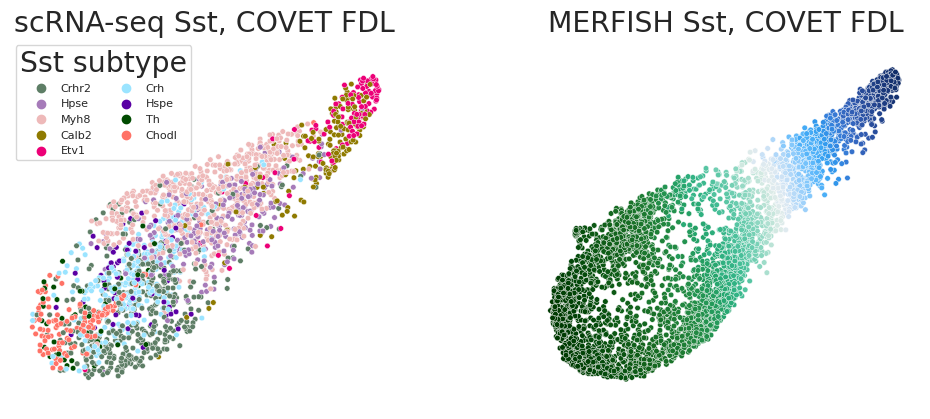

In [74]:



plt.figure(figsize=(10,5))

plt.subplot(121)
sns.scatterplot(x = sc_data_sst.obsm['FDL_COVET'][:, 0], 
                y = sc_data_sst.obsm['FDL_COVET'][:, 1],  
                hue = sc_data_sst.obs['cluster_label'], s = 16,  palette= sst_palette, legend = True)
plt.tight_layout()
plt.xlim([xmin, xmax])
plt.ylim([ymin, ymax])
plt.title('scRNA-seq Sst, COVET FDL')
legend = plt.legend(title = 'Sst subtype', prop={'size': 8}, fontsize = '8',  markerscale = 1, ncol = 2)
plt.axis('off')

plt.subplot(122)
ax = sns.scatterplot(x = st_data_sst.obsm['FDL_COVET'][:, 0], 
                y = st_data_sst.obsm['FDL_COVET'][:, 1],  
                c = st_data_sst.obsm['DC_COVET'][:,0], s = 16,  cmap= 'cet_CET_D13', legend = False)
plt.tight_layout()
plt.xlim([xmin, xmax])
plt.ylim([ymin, ymax])
plt.axis('off')
plt.title('MERFISH Sst, COVET FDL')
plt.show()

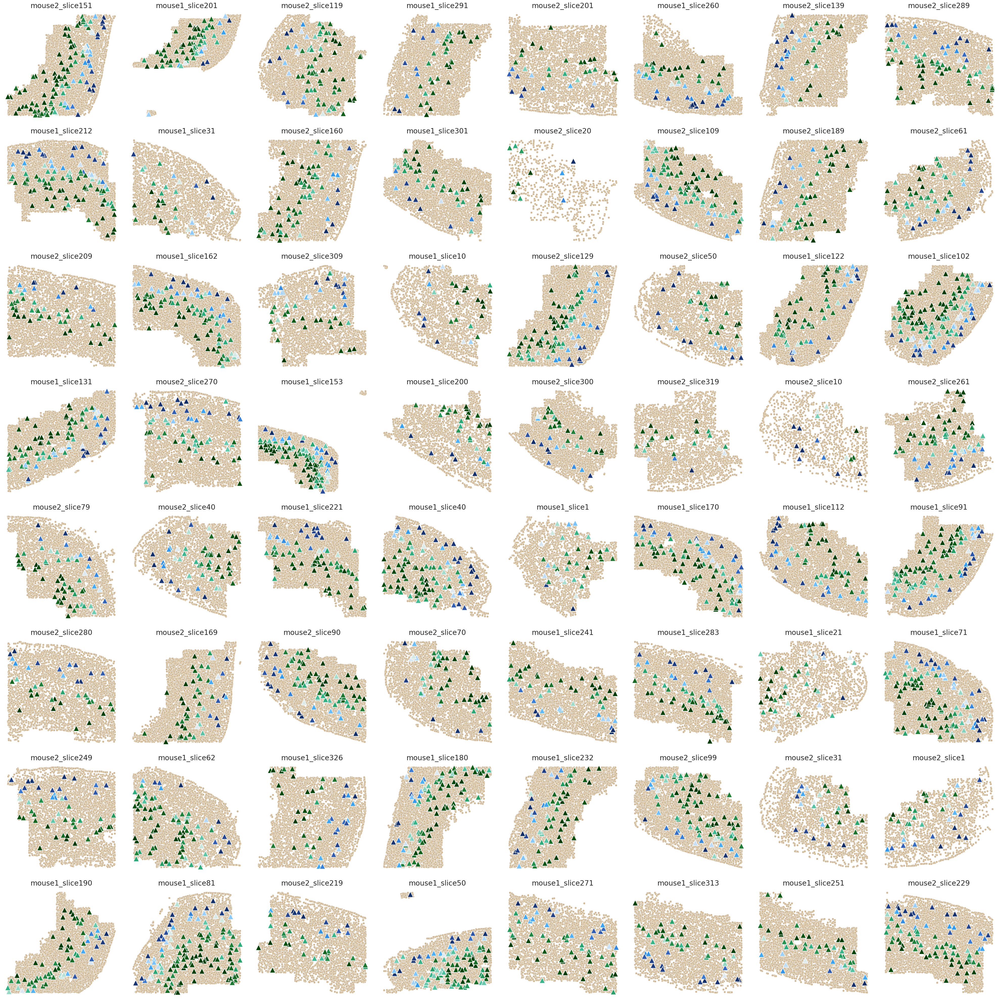

In [75]:
fig = plt.figure(figsize=(40,40))

for ind, batch in enumerate(list(set(st_data.obs['batch']))):
    st_dataBatch = st_data[st_data.obs['batch'] == batch]
    st_dataPlotBatch = st_data_sst[st_data_sst.obs['batch'] == batch]
    
    plt.subplot(8,8, 1+ ind)
    sns.scatterplot(x = st_dataBatch.obsm['spatial'][:, 0], y = st_dataBatch.obsm['spatial'][:, 1],  color = (207/255,185/255,151/255, 1))
    sns.scatterplot(x = st_dataPlotBatch.obsm['spatial'][:, 0], y = st_dataPlotBatch.obsm['spatial'][:, 1], marker = '^',
                        c = st_dataPlotBatch.obsm['DC_COVET'][:, 0], s = 256,  cmap= 'cet_CET_D13', legend = False)
    plt.title(batch)
    plt.axis('off')
    plt.tight_layout()
    
plt.show()

# Subtype Depth

- Box plot of cortical depth for each cell in every subtype

In [77]:
depth_df = pd.DataFrame()
depth_df['Subtype'] = sc_data_sst.obs['cluster_label']
depth_df['Depth'] = -sc_data_sst.obsm['DC_COVET'][:,0]

In [78]:
subtype_depth_order = depth_df.groupby(['Subtype']).mean().sort_values(by = 'Depth', ascending=False).index

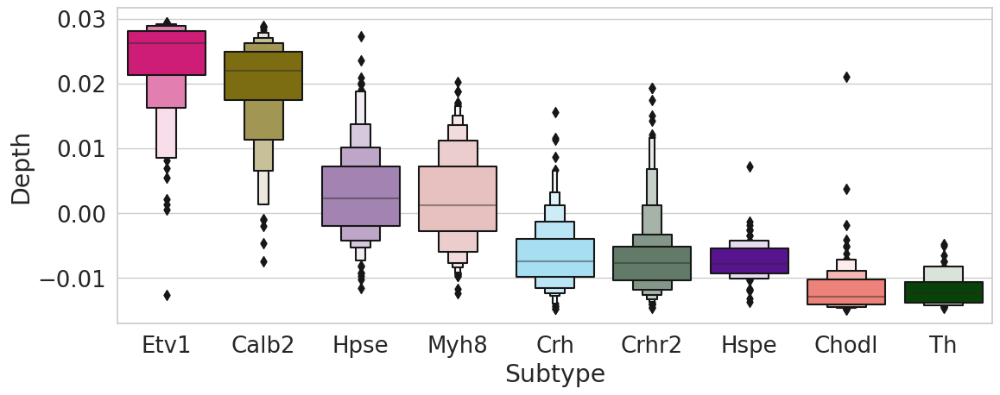

In [79]:
plt.figure(figsize=(12,5))
sns.set(font_scale=1.7) 
sns.set_style("whitegrid")
sns.boxenplot(depth_df, x = 'Subtype', y = 'Depth',# bw = 1, width = 0.9,
          order = subtype_depth_order, 
          palette = sst_palette)
plt.tight_layout()
plt.show()

# ENVI imputation on Spatial Data

In [80]:
tick_genes = np.asarray(['Cpne6','Adamts18','Pamr1', 'Zmat4', 'Dkkl1', 'Hs6st2', 'Slit1', 'Ighm'])

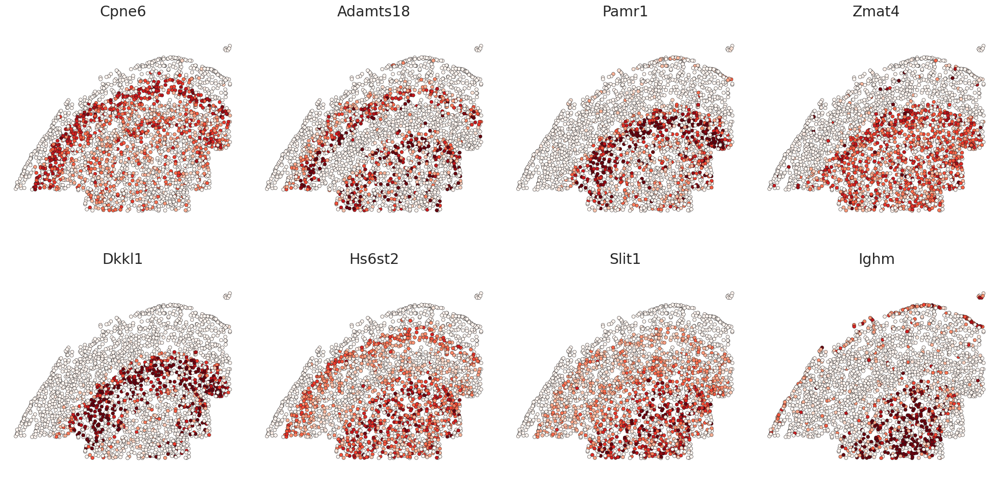

In [81]:
plt.figure(figsize=(20,10))

for ind, gene in enumerate(tick_genes):
    plt.subplot(2,4,1+ind)
    
    sns.scatterplot(x = st_data.obsm['spatial'][st_data.obs['batch'] == 'mouse1_slice10'][:, 1], 
                    y = -st_data.obsm['spatial'][st_data.obs['batch'] == 'mouse1_slice10'][:, 0], legend = False,
                    c = NormalNorm(np.log(st_data[st_data.obs['batch'] == 'mouse1_slice10'].obsm['imputation'][gene] + 0.1)), cmap = 'Reds', vmax = 2, vmin =0,
                    s = 24, edgecolor = 'k')#, palette = cell_type_palette)
    plt.title(gene)
    plt.axis('equal')
    plt.axis('off')
    plt.tight_layout()
plt.show()